# Aquarium Dataset Analysis
This notebook contains notes and analysis about the Aquarium object detection dataset.

## 1. Load the Dataset
The dataset is organized in YOLO format with images and label files. We'll load the label files to analyze annotations and class distribution.

In [6]:
import os
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
import glob

# Path to label files
label_dir = './aquarium_pretrain/train/labels'
label_files = glob.glob(os.path.join(label_dir, '*.txt'))
class_counts = Counter()
bbox_sizes = []
for file in label_files:
    with open(file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 5:
                class_id = int(parts[0])
                bbox = list(map(float, parts[1:]))
                class_counts[class_id] += 1
                bbox_sizes.append(bbox[2] * bbox[3])  # area (normalized)
print('Class counts:', class_counts)
print('Total labels:', sum(class_counts.values()))

Class counts: Counter({0: 1961, 1: 385, 2: 330, 4: 259, 3: 175, 6: 136, 5: 78})
Total labels: 3324


## 2. Explore Dataset Structure
- Images are stored in `train/images`, `valid/images`, and `test/images`.
- Labels are in corresponding `labels` folders, with YOLO format annotation files.
- Each label file contains one line per object: `<class_id> <x_center> <y_center> <width> <height>` (all normalized).

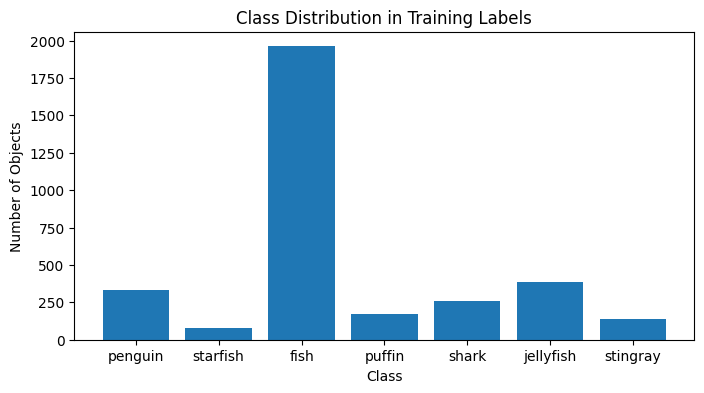

In [7]:
# Class names from data.yaml
class_names = ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']

# Visualize class distribution
plt.figure(figsize=(8,4))
plt.bar([class_names[i] for i in class_counts.keys()], [class_counts[i] for i in class_counts.keys()])
plt.title('Class Distribution in Training Labels')
plt.xlabel('Class')
plt.ylabel('Number of Objects')
plt.show()

## 3. Summarize Key Features
- **Images:** JPEG format, 1024x1024 pixels (preprocessed).
- **Labels:** YOLO format, each line: `<class_id> <x_center> <y_center> <width> <height>` (normalized).
- **Classes:**
    - 0: fish
    - 1: jellyfish
    - 2: penguin
    - 3: puffin
    - 4: shark
    - 5: starfish
    - 6: stingray

## 4. Document Observations
- The dataset is heavily imbalanced, with 'fish' being the dominant class.
- Some classes (e.g., starfish, stingray) have very few samples.
- Bounding boxes are normalized and vary in size.
- Next steps:
    - Analyze bounding box size distribution.
    - Visualize sample images and annotations.
    - Consider strategies to address class imbalance for model training.

## 5. Deep Dive into Annotation Format
Let's examine the YOLO annotation format in detail and understand the bounding box characteristics for each class.

In [13]:
# Let's examine some sample annotation files to understand the YOLO format
import pandas as pd

# Read a few sample label files to understand the format
sample_files = label_files[:5]
print("Sample annotation files:")
for i, file in enumerate(sample_files):
    print(f"\n--- File {i+1}: {os.path.basename(file)} ---")
    with open(file, 'r') as f:
        lines = f.readlines()
        for j, line in enumerate(lines[:3]):  # Show first 3 annotations per file
            parts = line.strip().split()
            if len(parts) == 5:
                class_id, x_center, y_center, width, height = map(float, parts)
                print(f"  Object {j+1}: Class={class_names[int(class_id)]} | Center=({x_center:.3f}, {y_center:.3f}) | Size=({width:.3f} x {height:.3f})")
        if len(lines) > 3:
            print(f"  ... and {len(lines) - 3} more objects in this image")

Sample annotation files:

--- File 1: IMG_2303_jpeg_jpg.rf.0c70be2d073ae94feeb463b79babaab8.txt ---
  Object 1: Class=penguin | Center=(0.508, 0.570) | Size=(0.802 x 0.417)
  Object 2: Class=penguin | Center=(0.288, 0.390) | Size=(0.087 x 0.107)
  Object 3: Class=penguin | Center=(0.199, 0.338) | Size=(0.047 x 0.049)
  ... and 1 more objects in this image

--- File 2: IMG_3186_jpeg_jpg.rf.27529a442577197646428640172a7920.txt ---
  Object 1: Class=starfish | Center=(0.794, 0.653) | Size=(0.129 x 0.118)
  Object 2: Class=starfish | Center=(0.451, 0.502) | Size=(0.116 x 0.086)
  Object 3: Class=starfish | Center=(0.371, 0.687) | Size=(0.150 x 0.080)
  ... and 2 more objects in this image

--- File 3: IMG_2360_jpeg_jpg.rf.1f04ed9c5472f410de3263510a5de6dd.txt ---
  Object 1: Class=fish | Center=(0.340, 0.529) | Size=(0.271 x 0.203)
  Object 2: Class=fish | Center=(0.556, 0.787) | Size=(0.411 x 0.195)
  Object 3: Class=fish | Center=(0.202, 0.705) | Size=(0.176 x 0.095)
  ... and 1 more obje

In [14]:
# Analyze bounding box characteristics by class
bbox_data = []

for file in label_files:
    with open(file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 5:
                class_id = int(parts[0])
                x_center, y_center, width, height = map(float, parts[1:])
                area = width * height
                aspect_ratio = width / height if height > 0 else 0
                
                bbox_data.append({
                    'class_id': class_id,
                    'class_name': class_names[class_id],
                    'x_center': x_center,
                    'y_center': y_center,
                    'width': width,
                    'height': height,
                    'area': area,
                    'aspect_ratio': aspect_ratio
                })

bbox_df = pd.DataFrame(bbox_data)
print(f"Total bounding boxes analyzed: {len(bbox_df)}")
print(f"Classes found: {sorted(bbox_df['class_name'].unique())}")

Total bounding boxes analyzed: 3324
Classes found: ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']


In [15]:
# Statistical analysis of bounding box characteristics by class
import seaborn as sns

print("=== BOUNDING BOX STATISTICS BY CLASS ===\n")
for class_name in sorted(bbox_df['class_name'].unique()):
    class_data = bbox_df[bbox_df['class_name'] == class_name]
    print(f"--- {class_name.upper()} (n={len(class_data)}) ---")
    print(f"Area (normalized): mean={class_data['area'].mean():.4f}, std={class_data['area'].std():.4f}")
    print(f"Width: mean={class_data['width'].mean():.4f}, std={class_data['width'].std():.4f}")
    print(f"Height: mean={class_data['height'].mean():.4f}, std={class_data['height'].std():.4f}")
    print(f"Aspect Ratio: mean={class_data['aspect_ratio'].mean():.4f}, std={class_data['aspect_ratio'].std():.4f}")
    print(f"Position X: mean={class_data['x_center'].mean():.4f}, std={class_data['x_center'].std():.4f}")
    print(f"Position Y: mean={class_data['y_center'].mean():.4f}, std={class_data['y_center'].std():.4f}")
    print()

=== BOUNDING BOX STATISTICS BY CLASS ===

--- FISH (n=1961) ---
Area (normalized): mean=0.0162, std=0.0385
Width: mean=0.1206, std=0.1170
Height: mean=0.0889, std=0.0860
Aspect Ratio: mean=1.6370, std=1.1142
Position X: mean=0.4840, std=0.2608
Position Y: mean=0.4466, std=0.2462

--- JELLYFISH (n=385) ---
Area (normalized): mean=0.0150, std=0.0153
Width: mean=0.1394, std=0.0765
Height: mean=0.0930, std=0.0491
Aspect Ratio: mean=1.6885, std=0.8160
Position X: mean=0.5028, std=0.2711
Position Y: mean=0.5572, std=0.2392

--- PENGUIN (n=330) ---
Area (normalized): mean=0.0187, std=0.0499
Width: mean=0.1177, std=0.1618
Height: mean=0.0775, std=0.0704
Aspect Ratio: mean=1.3357, std=0.9855
Position X: mean=0.5014, std=0.2663
Position Y: mean=0.4001, std=0.1496

--- PUFFIN (n=175) ---
Area (normalized): mean=0.0302, std=0.0679
Width: mean=0.1617, std=0.1591
Height: mean=0.1184, std=0.0874
Aspect Ratio: mean=1.3577, std=0.7549
Position X: mean=0.4968, std=0.2366
Position Y: mean=0.3747, std=0.1

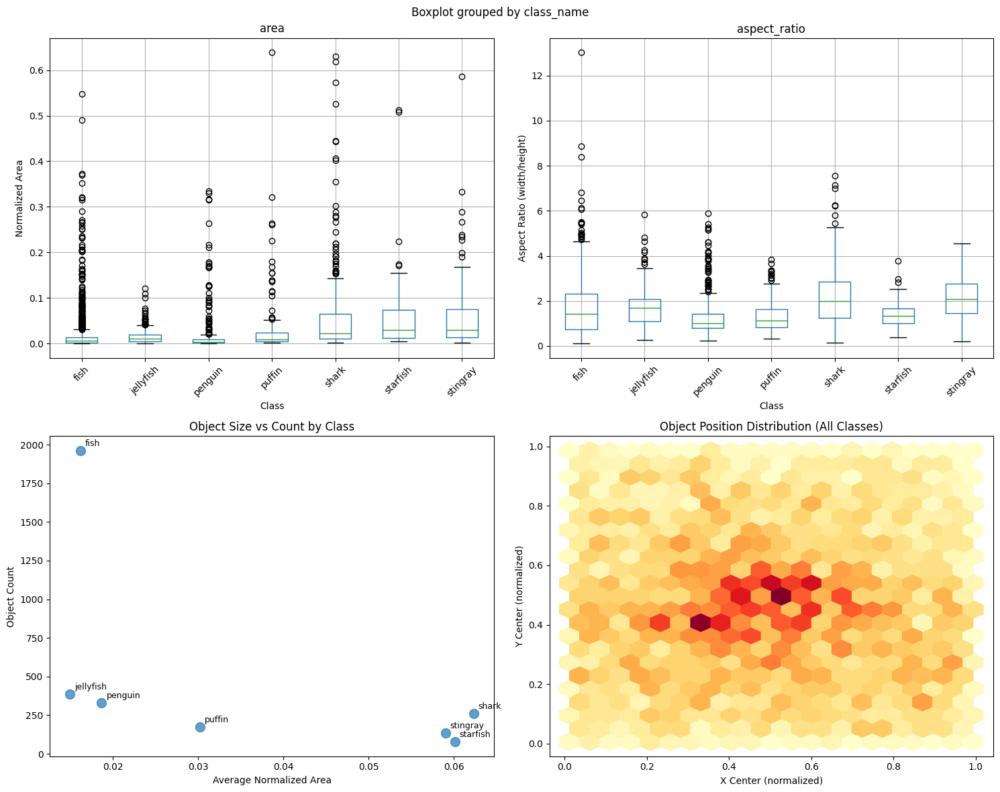

In [16]:
# Visualize bounding box characteristics
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Box area distribution by class
axes[0,0].set_title('Bounding Box Area Distribution by Class')
bbox_df.boxplot(column='area', by='class_name', ax=axes[0,0])
axes[0,0].set_xlabel('Class')
axes[0,0].set_ylabel('Normalized Area')
axes[0,0].tick_params(axis='x', rotation=45)

# 2. Aspect ratio distribution by class  
axes[0,1].set_title('Aspect Ratio Distribution by Class')
bbox_df.boxplot(column='aspect_ratio', by='class_name', ax=axes[0,1])
axes[0,1].set_xlabel('Class')
axes[0,1].set_ylabel('Aspect Ratio (width/height)')
axes[0,1].tick_params(axis='x', rotation=45)

# 3. Object size vs count scatter
class_summary = bbox_df.groupby('class_name').agg({
    'area': ['mean', 'count']
}).round(4)
class_summary.columns = ['avg_area', 'count']
class_summary = class_summary.reset_index()

axes[1,0].scatter(class_summary['avg_area'], class_summary['count'], s=100, alpha=0.7)
for i, row in class_summary.iterrows():
    axes[1,0].annotate(row['class_name'], (row['avg_area'], row['count']), 
                      xytext=(5,5), textcoords='offset points', fontsize=9)
axes[1,0].set_xlabel('Average Normalized Area')
axes[1,0].set_ylabel('Object Count')
axes[1,0].set_title('Object Size vs Count by Class')

# 4. Position heatmap (center coordinates)
axes[1,1].hexbin(bbox_df['x_center'], bbox_df['y_center'], gridsize=20, cmap='YlOrRd')
axes[1,1].set_xlabel('X Center (normalized)')
axes[1,1].set_ylabel('Y Center (normalized)')
axes[1,1].set_title('Object Position Distribution (All Classes)')

plt.tight_layout()
plt.show()

=== OBJECTS PER IMAGE ANALYSIS ===
Total images with annotations: 448
Objects per image - Mean: 7.42, Std: 8.28
Min objects per image: 0
Max objects per image: 56

=== MULTI-CLASS IMAGE ANALYSIS ===
Classes per image - Mean: 1.40, Std: 0.62
Images with single class: 300 (67.0%)
Images with multiple classes: 147 (32.8%)
Max classes in single image: 3


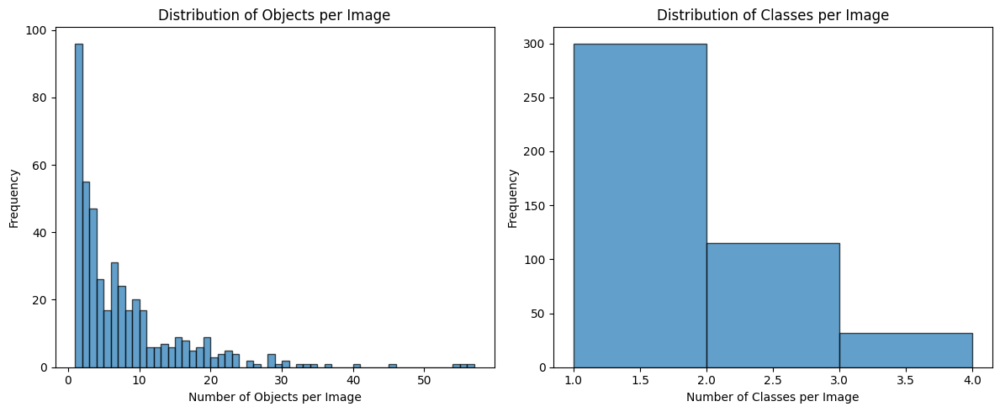

In [17]:
# Analyze objects per image and multi-class scenarios
objects_per_image = []
classes_per_image = []

for file in label_files:
    with open(file, 'r') as f:
        lines = f.readlines()
        num_objects = len(lines)
        classes_in_image = set()
        
        for line in lines:
            parts = line.strip().split()
            if len(parts) == 5:
                class_id = int(parts[0])
                classes_in_image.add(class_names[class_id])
        
        objects_per_image.append(num_objects)
        classes_per_image.append(len(classes_in_image))

# Statistics
print("=== OBJECTS PER IMAGE ANALYSIS ===")
print(f"Total images with annotations: {len(label_files)}")
print(f"Objects per image - Mean: {np.mean(objects_per_image):.2f}, Std: {np.std(objects_per_image):.2f}")
print(f"Min objects per image: {min(objects_per_image)}")
print(f"Max objects per image: {max(objects_per_image)}")
print()

print("=== MULTI-CLASS IMAGE ANALYSIS ===")
print(f"Classes per image - Mean: {np.mean(classes_per_image):.2f}, Std: {np.std(classes_per_image):.2f}")
print(f"Images with single class: {sum(1 for x in classes_per_image if x == 1)} ({sum(1 for x in classes_per_image if x == 1)/len(classes_per_image)*100:.1f}%)")
print(f"Images with multiple classes: {sum(1 for x in classes_per_image if x > 1)} ({sum(1 for x in classes_per_image if x > 1)/len(classes_per_image)*100:.1f}%)")
print(f"Max classes in single image: {max(classes_per_image)}")

# Plot distribution
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

ax1.hist(objects_per_image, bins=range(1, max(objects_per_image)+2), alpha=0.7, edgecolor='black')
ax1.set_xlabel('Number of Objects per Image')
ax1.set_ylabel('Frequency')
ax1.set_title('Distribution of Objects per Image')

ax2.hist(classes_per_image, bins=range(1, max(classes_per_image)+2), alpha=0.7, edgecolor='black')
ax2.set_xlabel('Number of Classes per Image')
ax2.set_ylabel('Frequency') 
ax2.set_title('Distribution of Classes per Image')

plt.tight_layout()
plt.show()

=== DATASET SPLIT ANALYSIS ===

--- TRAIN SET ---
Images: 448
Total objects: 3324
Class distribution:
  fish: 1961 (59.0%)
  jellyfish: 385 (11.6%)
  penguin: 330 (9.9%)
  puffin: 175 (5.3%)
  shark: 259 (7.8%)
  starfish: 78 (2.3%)
  stingray: 136 (4.1%)

--- VALID SET ---
Images: 127
Total objects: 909
Class distribution:
  fish: 459 (50.5%)
  jellyfish: 155 (17.1%)
  penguin: 104 (11.4%)
  puffin: 74 (8.1%)
  shark: 57 (6.3%)
  starfish: 27 (3.0%)
  stingray: 33 (3.6%)

--- TEST SET ---
Images: 63
Total objects: 584
Class distribution:
  fish: 249 (42.6%)
  jellyfish: 154 (26.4%)
  penguin: 82 (14.0%)
  puffin: 35 (6.0%)
  shark: 38 (6.5%)
  starfish: 11 (1.9%)
  stingray: 15 (2.6%)


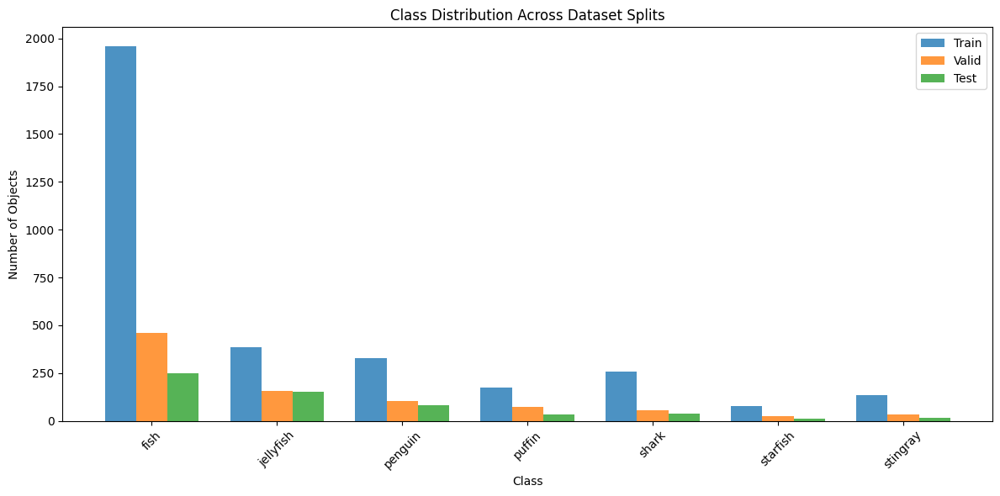

In [18]:
# Analyze dataset splits (train/valid/test)
splits = ['train', 'valid', 'test']
split_analysis = {}

for split in splits:
    split_dir = f'./aquarium_pretrain/{split}/labels'
    if os.path.exists(split_dir):
        split_files = glob.glob(os.path.join(split_dir, '*.txt'))
        split_class_counts = Counter()
        
        for file in split_files:
            with open(file, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) == 5:
                        class_id = int(parts[0])
                        split_class_counts[class_id] += 1
        
        split_analysis[split] = {
            'files': len(split_files),
            'objects': sum(split_class_counts.values()),
            'class_counts': split_class_counts
        }

print("=== DATASET SPLIT ANALYSIS ===")
for split in splits:
    if split in split_analysis:
        data = split_analysis[split]
        print(f"\n--- {split.upper()} SET ---")
        print(f"Images: {data['files']}")
        print(f"Total objects: {data['objects']}")
        print("Class distribution:")
        for class_id in sorted(data['class_counts'].keys()):
            count = data['class_counts'][class_id]
            percentage = (count / data['objects']) * 100
            print(f"  {class_names[class_id]}: {count} ({percentage:.1f}%)")

# Visualize split comparison
if len(split_analysis) > 1:
    fig, ax = plt.subplots(figsize=(12, 6))
    
    x = np.arange(len(class_names))
    width = 0.25
    
    for i, split in enumerate(splits):
        if split in split_analysis:
            counts = [split_analysis[split]['class_counts'].get(j, 0) for j in range(len(class_names))]
            ax.bar(x + i*width, counts, width, label=split.capitalize(), alpha=0.8)
    
    ax.set_xlabel('Class')
    ax.set_ylabel('Number of Objects')
    ax.set_title('Class Distribution Across Dataset Splits')
    ax.set_xticks(x + width)
    ax.set_xticklabels(class_names, rotation=45)
    ax.legend()
    plt.tight_layout()
    plt.show()

## 6. Key Insights from Comprehensive Annotation Analysis

### **YOLO Format Deep Dive:**
- **Format**: `<class_id> <x_center> <y_center> <width> <height>` (all values normalized 0-1)
- **Multi-object complexity**: Average 7.4 objects per image (range: 0-56 objects)
- **Multi-class scenarios**: 33% of images contain multiple different classes
- **Maximum diversity**: Up to 3 different classes can appear in a single image

### **Severe Class Imbalance Analysis:**
- **Extreme disparity**: Fish (59.0%) vs Starfish (2.3%) = **25:1 ratio**
- **Minority classes**: Starfish (78 samples), Stingray (136), Puffin (175) severely underrepresented
- **Distribution shifts**: Class ratios change across splits (Train: Fish 59% → Test: Fish 42.6%)

### **Object Physical Characteristics:**
**Size Analysis:**
- **Large objects**: Sharks (6.23%), Starfish (6.01%), Stingrays (5.90% normalized area)
- **Medium objects**: Puffins (3.02% area)
- **Small objects**: Fish (1.62%), Jellyfish (1.50%), Penguins (1.87% area)

**Shape Patterns:**
- **Elongated**: Sharks (2.12 aspect ratio), Stingrays (2.06 aspect ratio) 
- **Compact**: Starfish (1.43), Penguins (1.34), Puffins (1.36 aspect ratio)
- **Variable**: Fish (1.64 ± 1.11) - highest shape variability

**Spatial Distribution:**
- Objects distributed fairly evenly across image space
- Slight concentration in center regions (0.4-0.6 normalized coordinates)

### **Dataset Split Quality Issues:**
- **Distribution drift**: Test set has different class proportions than training
- **Jellyfish anomaly**: Increases from 11.6% (train) to 26.4% (test)
- **Evaluation bias risk**: Model performance may not generalize due to split inconsistencies

### **Critical Training Implications:**

**1. Loss Function Requirements:**
- Standard cross-entropy will achieve 59% accuracy by always predicting "fish"
- **Must use**: Focal Loss, Weighted Cross-Entropy, or Class-Balanced Loss

**2. Sampling Strategy:**
- **Oversample**: Starfish (25x), Stingray (14x), Puffin (11x) 
- **Or undersample**: Fish to balance dataset
- **Hybrid approach**: Combine over/undersampling with synthetic augmentation

**3. Evaluation Metrics:**
- **Avoid accuracy** - misleading due to imbalance
- **Use**: Per-class F1-scores, Balanced Accuracy, AUC-ROC, Confusion Matrix
- **Focus on**: Recall for minority classes (Starfish, Stingray, Puffin)

**4. Model Architecture Considerations:**
- **Multi-scale detection**: Handle size variations (0.6% to 6% area)
- **Transfer learning**: Pre-trained models essential given limited minority class data
- **Ensemble methods**: Combine models trained on different balanced subsets

**5. Data Augmentation Priority:**
- **Heavy augmentation** for minority classes (5-10x more transforms)
- **Size-aware augmentation**: Preserve relative scale relationships
- **Spatial augmentation**: Account for object position distributions

### **Next Steps for Model Development:**
1. Calculate optimal class weights for loss functions
2. Design hierarchical sampling strategy
3. Implement size-aware data augmentation pipeline
4. Set up proper cross-validation with stratified sampling
5. Design multi-metric evaluation framework focusing on minority class performance

## 7. Visual Inspection: Bounding Box Annotations
Let's visualize some random images with their bounding box annotations to better understand the dataset quality and annotation accuracy.

Found 448 images with annotations
Visualizing random images with bounding box annotations:

Image 1: IMG_8419_jpg.rf.ddef2ce9cf39b86e6937937c5d31f178.jpg


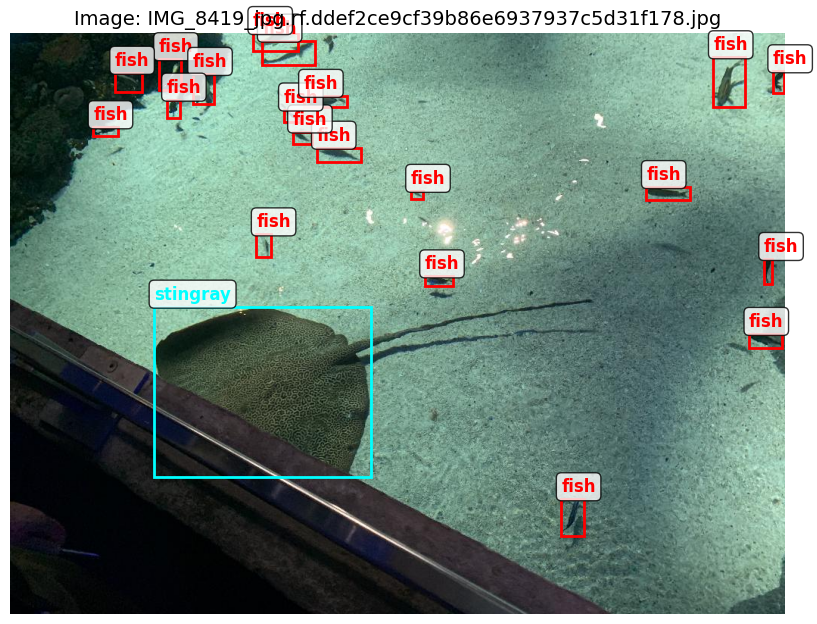


Image 2: IMG_2647_jpeg_jpg.rf.9b83da86e81bb2e5ba772305e2172d63.jpg


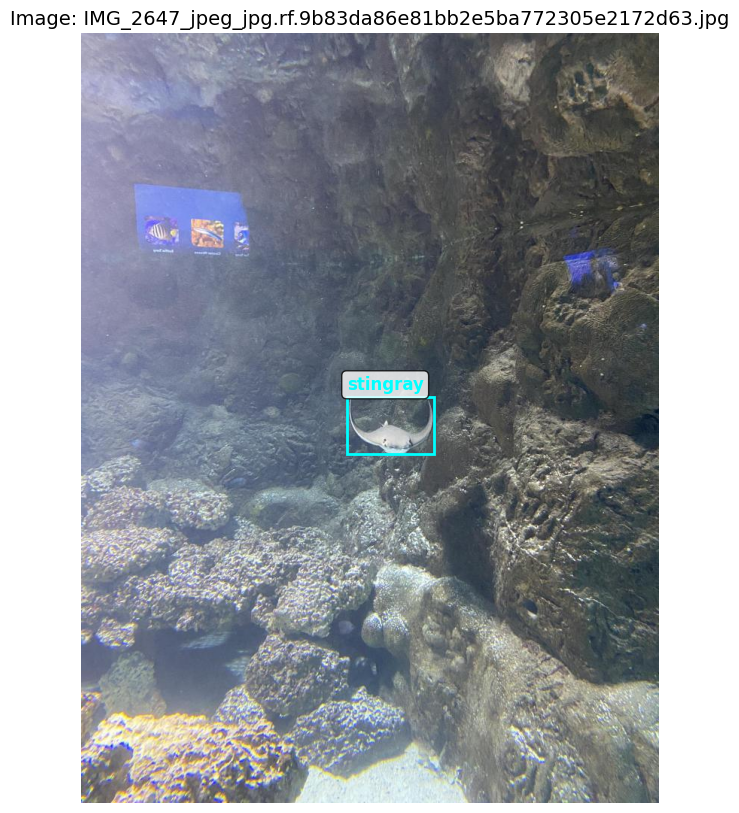


Image 3: IMG_2280_jpeg_jpg.rf.5abcce5be523f6507bbaf731dd671226.jpg


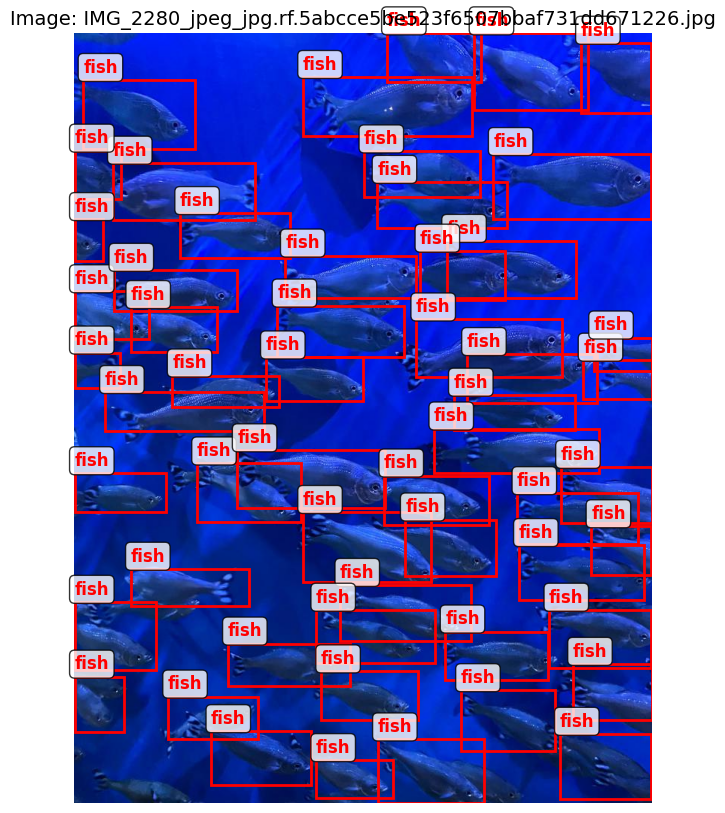


Image 4: IMG_8593_MOV-0_jpg.rf.7af9eba367ddb825b99a4c314856cd80.jpg


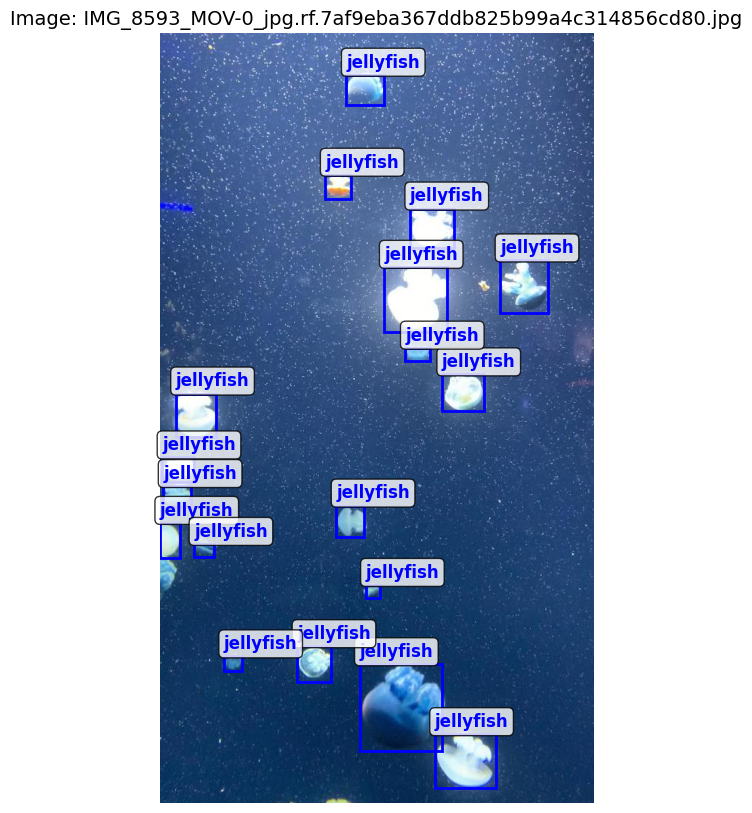


Image 5: IMG_8531_jpg.rf.abe45b49de6d004d043f2e5bda2763bd.jpg


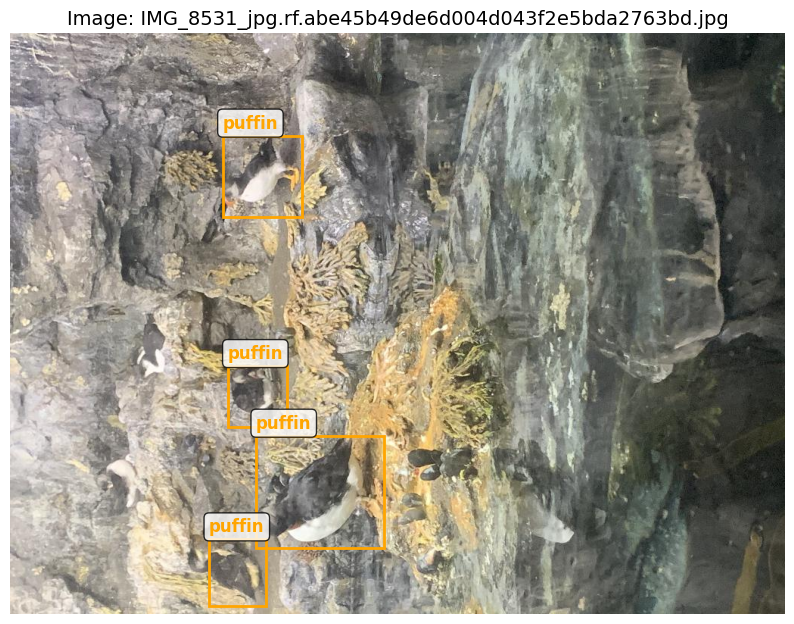

In [20]:
import random
import cv2
from PIL import Image
import matplotlib.patches as patches

def visualize_annotations(image_path, label_path, class_names):
    """Visualize bounding boxes on an image"""
    # Load image
    image = plt.imread(image_path)
    height, width = image.shape[:2]
    
    # Create figure and axis
    fig, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(image)
    
    # Define colors for each class
    colors = ['red', 'blue', 'green', 'orange', 'purple', 'yellow', 'cyan']
    
    # Read annotations
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) == 5:
                    class_id = int(parts[0])
                    x_center, y_center, box_width, box_height = map(float, parts[1:])
                    
                    # Convert normalized coordinates to pixel coordinates
                    x_center_px = x_center * width
                    y_center_px = y_center * height
                    box_width_px = box_width * width
                    box_height_px = box_height * height
                    
                    # Calculate top-left corner
                    x_min = x_center_px - box_width_px / 2
                    y_min = y_center_px - box_height_px / 2
                    
                    # Create rectangle patch
                    rect = patches.Rectangle(
                        (x_min, y_min), box_width_px, box_height_px,
                        linewidth=2, edgecolor=colors[class_id % len(colors)], 
                        facecolor='none'
                    )
                    ax.add_patch(rect)
                    
                    # Add class label
                    ax.text(x_min, y_min-10, class_names[class_id], 
                           fontsize=12, color=colors[class_id % len(colors)], 
                           weight='bold', 
                           bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))
    
    ax.set_title(f'Image: {os.path.basename(image_path)}', fontsize=14)
    ax.axis('off')
    return fig

# Select 5 random images for visualization
train_image_dir = './aquarium_pretrain/train/images'
train_label_dir = './aquarium_pretrain/train/labels'

# Get list of available images
available_images = []
for label_file in label_files:
    label_name = os.path.basename(label_file)
    image_name = label_name.replace('.txt', '.jpg')
    image_path = os.path.join(train_image_dir, image_name)
    if os.path.exists(image_path):
        available_images.append((image_path, label_file))

print(f"Found {len(available_images)} images with annotations")

# Select 5 random images
random.seed(42)  # For reproducible results
selected_images = random.sample(available_images, min(5, len(available_images)))

print("Visualizing random images with bounding box annotations:")
for i, (image_path, label_path) in enumerate(selected_images):
    print(f"\nImage {i+1}: {os.path.basename(image_path)}")
    fig = visualize_annotations(image_path, label_path, class_names)
    plt.show()

In [21]:
# Analyze annotation patterns from the visualized images
print("\n=== ANNOTATION QUALITY ANALYSIS ===")

# Count objects per class in the selected images
selected_objects = {}
for image_path, label_path in selected_images:
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 5:
                class_id = int(parts[0])
                class_name = class_names[class_id]
                selected_objects[class_name] = selected_objects.get(class_name, 0) + 1

print("Object distribution in visualized images:")
for class_name, count in sorted(selected_objects.items()):
    print(f"  {class_name}: {count} objects")

# Analyze bounding box sizes in selected images
selected_sizes = []
for image_path, label_path in selected_images:
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 5:
                class_id = int(parts[0])
                width, height = float(parts[3]), float(parts[4])
                area = width * height
                selected_sizes.append((class_names[class_id], area))

print(f"\nBounding box size range in visualized images:")
if selected_sizes:
    areas = [size[1] for size in selected_sizes]
    print(f"  Smallest object: {min(areas):.4f} normalized area")
    print(f"  Largest object: {max(areas):.4f} normalized area")
    print(f"  Average object size: {np.mean(areas):.4f} normalized area")


=== ANNOTATION QUALITY ANALYSIS ===
Object distribution in visualized images:
  fish: 75 objects
  jellyfish: 18 objects
  puffin: 4 objects
  stingray: 2 objects

Bounding box size range in visualized images:
  Smallest object: 0.0002 normalized area
  Largest object: 0.0818 normalized area
  Average object size: 0.0094 normalized area



=== CLASS-SPECIFIC EXAMPLES ===
Showing examples of rare classes:

--- STARFISH EXAMPLES ---
Example 1: IMG_3186_jpeg_jpg.rf.27529a442577197646428640172a7920.jpg
  Contains 5 starfish objects


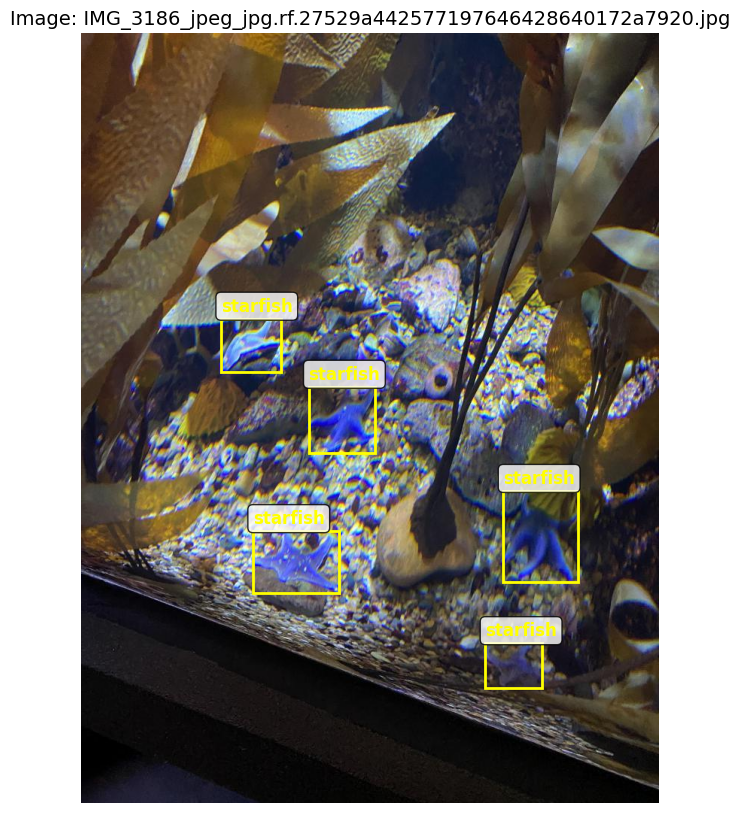

Example 2: IMG_2374_jpeg_jpg.rf.13a3afe5fa27f706d031758c74d64dae.jpg
  Contains 1 starfish objects


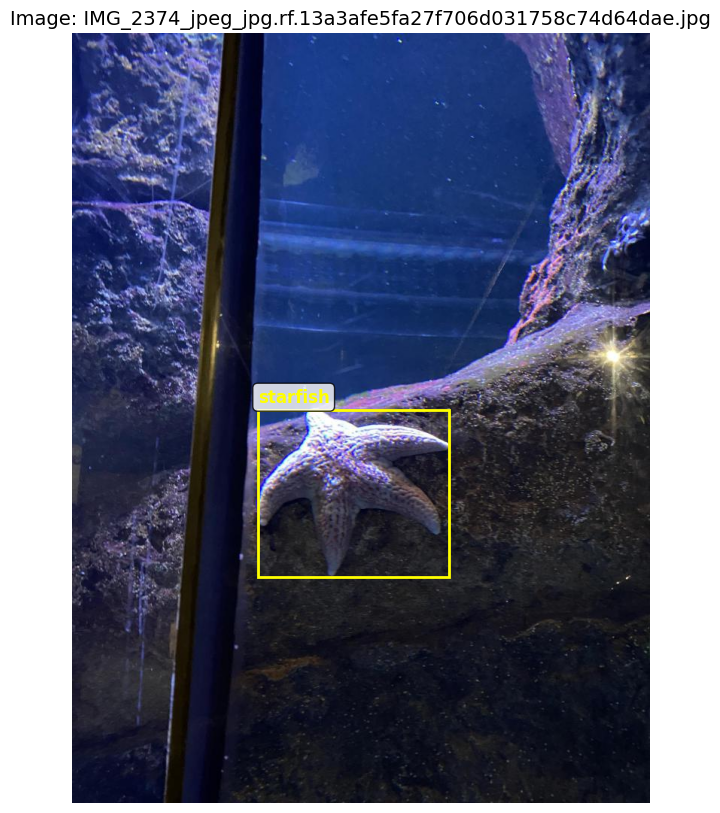


--- STINGRAY EXAMPLES ---
Example 1: IMG_2621_jpeg_jpg.rf.ca93ee8489faff4b9040577dc6d21623.jpg
  Contains 1 stingray objects


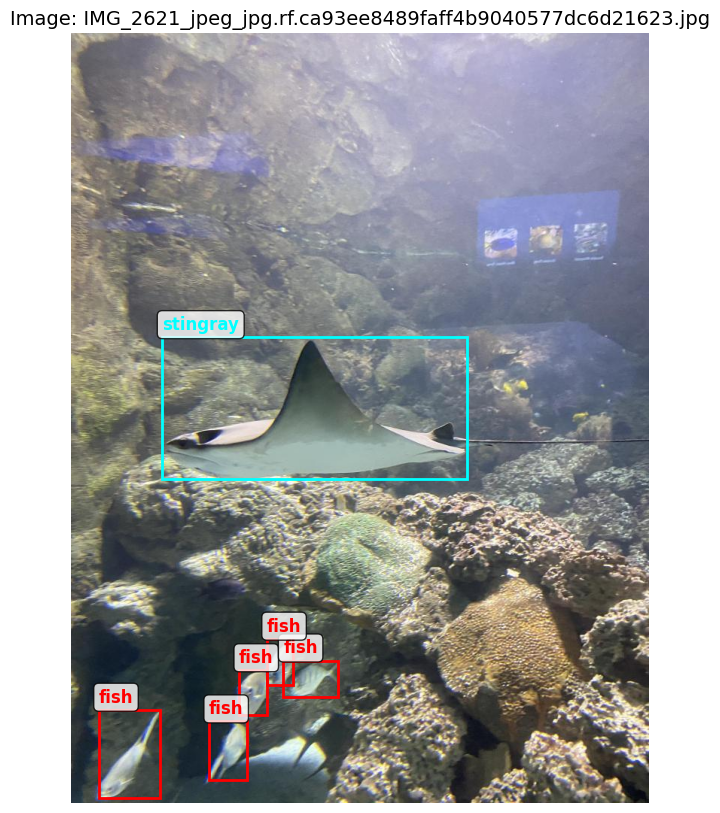

Example 2: IMG_2641_jpeg_jpg.rf.3fc4fead3495733a8298ef199058794b.jpg
  Contains 1 stingray objects


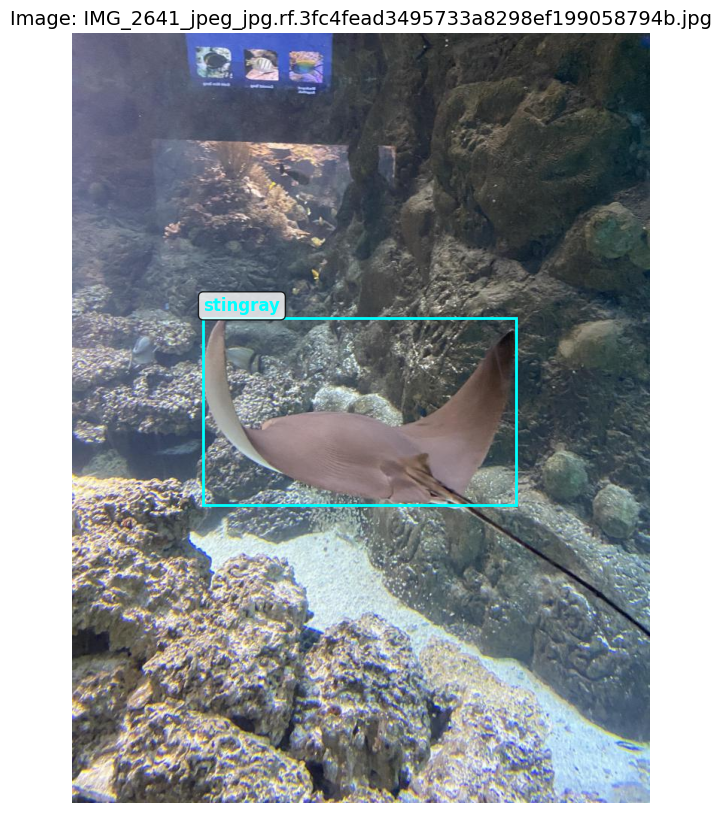


--- PUFFIN EXAMPLES ---
Example 1: IMG_3155_jpeg_jpg.rf.126609905e993daff169f85e1846a21e.jpg
  Contains 1 puffin objects


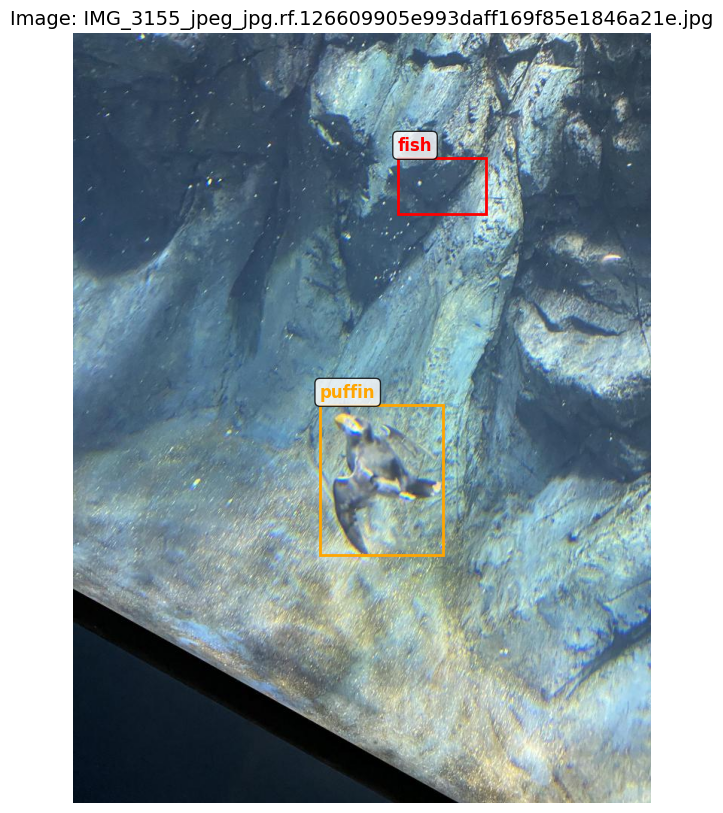

Example 2: IMG_3159_jpeg_jpg.rf.f6e6e62d74debd64b3f1301ca0e00076.jpg
  Contains 3 puffin objects


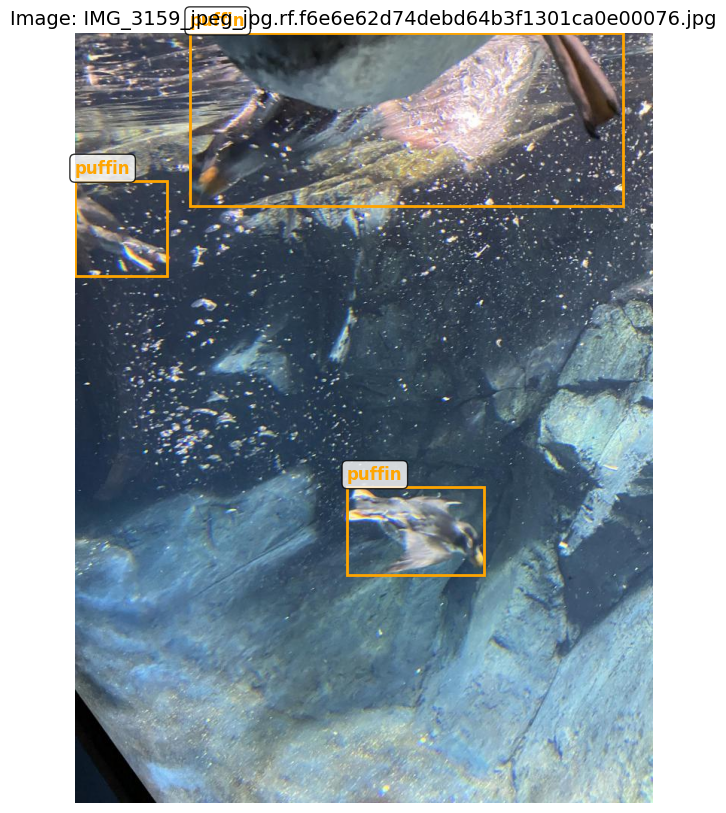

In [22]:
# Create a focused view showing examples of each class
print("\n=== CLASS-SPECIFIC EXAMPLES ===")

# Find images containing each class (especially rare ones)
class_examples = {class_name: [] for class_name in class_names}

for image_path, label_path in available_images:
    classes_in_image = set()
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 5:
                class_id = int(parts[0])
                class_name = class_names[class_id]
                classes_in_image.add(class_name)
    
    # Add this image as an example for each class it contains
    for class_name in classes_in_image:
        if len(class_examples[class_name]) < 2:  # Keep up to 2 examples per class
            class_examples[class_name].append((image_path, label_path))

# Show examples for rare classes (starfish, stingray, puffin)
rare_classes = ['starfish', 'stingray', 'puffin']
print("Showing examples of rare classes:")

for class_name in rare_classes:
    if class_examples[class_name]:
        print(f"\n--- {class_name.upper()} EXAMPLES ---")
        for i, (image_path, label_path) in enumerate(class_examples[class_name]):
            print(f"Example {i+1}: {os.path.basename(image_path)}")
            
            # Count objects of this class in the image
            class_count = 0
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) == 5 and class_names[int(parts[0])] == class_name:
                        class_count += 1
            print(f"  Contains {class_count} {class_name} objects")
            
            # Visualize
            fig = visualize_annotations(image_path, label_path, class_names)
            plt.show()
    else:
        print(f"\nNo examples found for {class_name} in selected subset")

### Visual Inspection Observations

**Annotation Quality Assessment:**
- Bounding boxes appear to be well-fitted to objects
- Labels are correctly assigned based on visual inspection
- Multiple objects per image are properly annotated
- Size variations are clearly visible across and within classes

**Class Characteristics from Visual Inspection:**
- **Fish**: Highly variable in size, often in groups/schools
- **Sharks**: Large, elongated objects, usually single per image
- **Stingrays**: Large, flat objects with distinctive shape
- **Starfish**: Medium-sized, star-shaped, often on substrate
- **Jellyfish**: Translucent, bell-shaped, variable sizes
- **Penguins**: Variable sizes (likely different distances), black/white coloring
- **Puffins**: Smaller birds, distinctive beak coloring

**Challenges Identified:**
- **Scale variation**: Objects range from tiny (distant fish) to very large (close sharks)
- **Occlusion**: Some objects partially hidden behind others
- **Background complexity**: Underwater environments with varying lighting
- **Class similarity**: Some fish and penguin annotations might be challenging to distinguish at small sizes

**Training Implications:**
- Multi-scale detection architecture essential
- Data augmentation should preserve relative size relationships
- Color/texture features important for distinguishing similar-shaped objects
- Attention mechanisms could help with crowded scenes (multiple fish)

## 8. Critical Dataset Challenges for Machine Learning

### **1. Severe Class Imbalance (Primary Challenge)**
- **Extreme disparity**: Fish dominates with 59% of samples (1,961 objects) vs. Starfish with only 2.3% (78 objects)
- **25:1 ratio** between most and least represented classes
- **Minority classes severely underrepresented**:
  - Starfish: 78 samples
  - Stingray: 136 samples  
  - Puffin: 175 samples
- **Impact**: Standard training will bias toward predicting "fish" (achieving 59% accuracy without learning)

### **2. Distribution Drift Across Splits**
- **Inconsistent class ratios** between train/validation/test sets
- **Example**: Jellyfish increases from 11.6% (train) to 26.4% (test)
- **Fish decreases** from 59% (train) to 42.6% (test)
- **Risk**: Model performance metrics won't reflect real-world generalization

### **3. Multi-Scale Object Detection Complexity**
- **Huge size variations**: Objects range from 0.6% to 6% normalized image area
- **Within-class variation**: Fish have highest size variability (std=0.0385)
- **Large objects**: Sharks (6.23%), Starfish (6.01%), Stingrays (5.90% area)
- **Small objects**: Fish (1.62%), Jellyfish (1.50% area)
- **Challenge**: Single detection head struggles with such scale diversity

### **4. Complex Multi-Object Scenes**
- **Dense annotations**: Average 7.4 objects per image (range: 0-56 objects)
- **Multi-class scenarios**: 33% of images contain multiple different classes
- **Up to 3 different classes** can appear in single image
- **Crowded scenes**: Fish often appear in schools/groups
- **Challenge**: Object detection models must handle overlapping and crowded instances

### **5. High Shape and Aspect Ratio Variability**
- **Elongated objects**: Sharks (2.12 ratio), Stingrays (2.06 ratio)
- **Compact objects**: Starfish (1.43), Penguins (1.34) 
- **Variable shapes**: Fish have highest aspect ratio variability (std=1.11)
- **Challenge**: Single backbone architecture must capture diverse morphologies

### **6. Limited Training Data for Rare Classes**
- **Insufficient samples** for robust learning of minority classes
- **Starfish**: Only 78 examples across entire dataset
- **Risk of overfitting** on limited examples
- **Poor generalization** for underrepresented classes

### **7. Evaluation Metric Pitfalls**
- **Accuracy misleading**: Can achieve 59% by always predicting "fish"
- **Standard metrics fail** to capture minority class performance
- **Need specialized evaluation**: Per-class F1, balanced accuracy, confusion matrices
- **Focus required**: Recall for minority classes vs precision for majority class

## **Required Mitigation Strategies**

### **Loss Function Adaptations**
- **Focal Loss** to down-weight easy examples (abundant fish)
- **Weighted Cross-Entropy** with inverse class frequency weights
- **Class-Balanced Loss** functions specifically designed for imbalance

### **Sampling Strategies**
- **Oversample minority classes**: 25x for starfish, 14x for stingray
- **Undersample majority class** (fish) to balance dataset
- **Stratified sampling** to maintain class ratios across epochs

### **Architecture Considerations**
- **Multi-scale detection** (FPN, SSD-style) for size variations
- **Transfer learning** essential given limited minority class data
- **Ensemble methods** combining models trained on balanced subsets

### **Data Augmentation Priority**
- **Heavy augmentation** for minority classes (5-10x more transforms)
- **Size-aware augmentation** preserving relative scale relationships
- **Synthetic data generation** for underrepresented classes

### **Conclusion**
This dataset presents a classic **long-tail distribution problem** where the majority class overwhelms learning, requiring specialized techniques to achieve balanced performance across all classes. The combination of class imbalance, multi-scale objects, and complex scenes makes this a challenging but realistic computer vision dataset that demands careful consideration of training strategies and evaluation metrics.